First, imports needed

In [1]:
import torch
import tqdm
from commander import load_model,get_model
import toolbox.vision as vision
import toolbox.losses as losses
import toolbox.searches as search
from loaders.data_generator import MCP_Generator,MCP_True_Generator
from loaders.siamese_loaders import siamese_loader

Here we initialize the parameters

In [2]:
model_path = "./runs/Fusion/MCP-0.7_11_True_dataset_mcp/model_best.pth.tar"

arch = {'original_features_num': 2,
        'num_blocks': 5,
        'in_features': 128,
        'out_features': 1,
        'depth_of_mlp': 5,
        'arch' : "simple",
        'embedding': "edge"
}

gen_args = {'num_examples_train': 10,
            'n_vertices': 50,
            'edge_density': 0.7,
            'planted': True,
            'clique_size': 11,
            'path_dataset': 'dataset_sbm'
}

In [3]:
model = get_model(arch)
model = load_model(model,'cpu',model_path)
print("#Parameters : ", sum(p.numel() for p in model.parameters() if p.requires_grad))

Fetching model simple - edge embedding 
Reading model from  ./runs/Fusion/MCP-0.7_11_True_dataset_mcp/model_best.pth.tar
#Parameters :  1354625


In [4]:
mcpg = MCP_Generator('train',gen_args)
mcpg.load_dataset()
train_loader_50_p = siamese_loader(mcpg, 1, mcpg.constant_n_vertices,shuffle=False)

Reading dataset at dataset_sbm/MCP_10_50_11_0.7/train.pkl


In [5]:
def check_clique(adj,clique_ind):
    """
    This function verifies that clique_ind is indeed a clique for adjacency matrix adj
    """
    clique_size = len(clique_ind)
    l_ind = [elt for elt in clique_ind]
    for i in range(clique_size):
        ind1 = l_ind[i]
        for j in range(i+1,clique_size):
            ind2 = l_ind[j]
            if adj[ind1,ind2].item()==0:
                return False
    return True

Here is the main loop. The algorithm to find the clique is is inspired of Beam Search algorithms: 
 
1. Order the nodes by "most probability" i.e. by their FGNN-inferred degree in descending order.  
2. Create the container of the clique with a fixed "beam" size (default to 1280). It will be ordered by descending length
3. Initialize with a clique containing only the most probable node.  
4. For each node starting at the second :  
    1. For each clique in the container : check if adding the node to the clique makes it a bigger clique.  
        - If yes : Insert the newly formed clique to the container at the right place to keep the order.  
        - If no : Don't.  
    2. Add the clique containing only the current node to the container at the end of the container  
    3. Truncate the container if it is bigger than the beam size. 
5. Keep the first element (which is one of the cliques of the biggest size found) 

In [6]:
def eval_mcp(loader,planted=False,path='figures/mcp',name='graph-',verbose=True):
    l_errors = [] #To calculate the difference in clique_size
    l_keep = [] #To keep the cliques

    for i,(data,target) in tqdm.tqdm(enumerate(loader)):
        raw_scores = model(data).squeeze(-1)

        probas = torch.sigmoid(raw_scores)
        prefix = 'not_'*(not gen_args['planted']) + 'planted'
        l_clique_inf = search.mcp_beam_method(data,raw_scores)
        l_clique_sol = search.mcp_beam_method(data,target)
        for inf_set,sol_set in zip(l_clique_inf,l_clique_sol):
            l_errors.append(len(l_clique_sol[0]) - len(l_clique_inf[0]))
            l_keep.append((l_clique_inf,l_clique_sol))
        if verbose:
            vision.show_probas(probas[0],solution=l_clique_sol[0],inf_sol_nodes=l_clique_inf[0],path=path,name=f'{prefix}-{name}{i}')
    return l_errors,l_keep

0it [00:00, ?it/s]/home/mautrib/Programmation/projet-dldiy/graph_neural_net/toolbox/searches.py:113: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_clique = torch.tensor(clique)


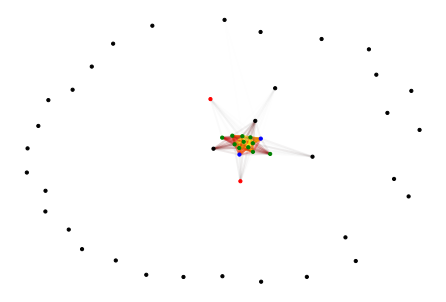

1it [00:10, 10.06s/it]

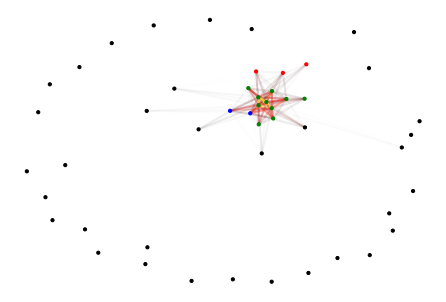

2it [00:19,  9.57s/it]

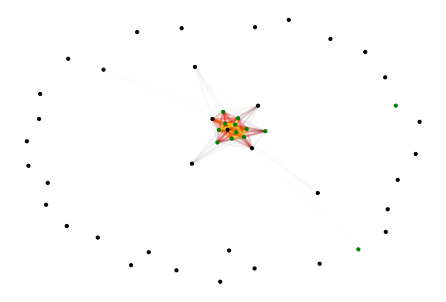

3it [00:27,  8.99s/it]

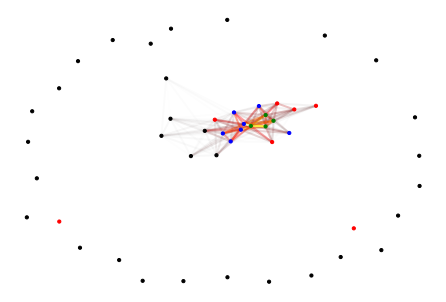

4it [00:37,  9.25s/it]

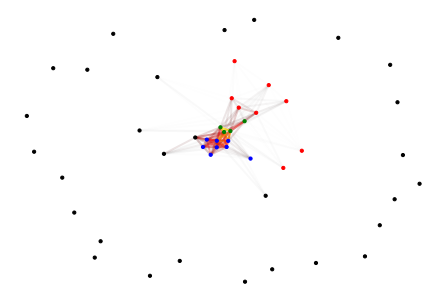

5it [00:46,  9.13s/it]

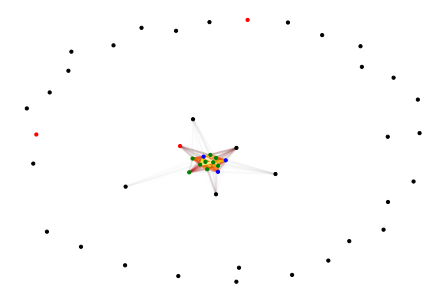

6it [00:53,  8.56s/it]

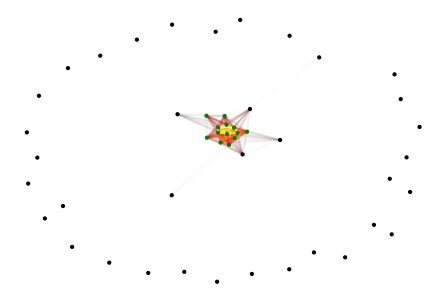

7it [01:03,  9.07s/it]

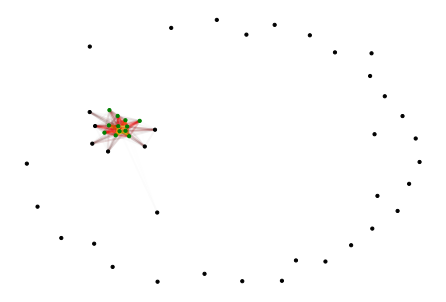

8it [01:11,  8.52s/it]

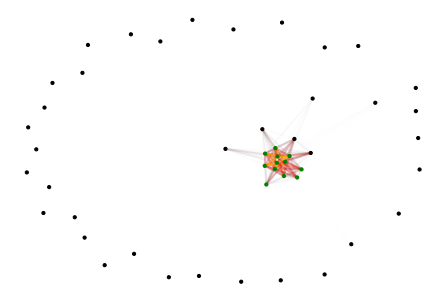

9it [01:18,  8.14s/it]

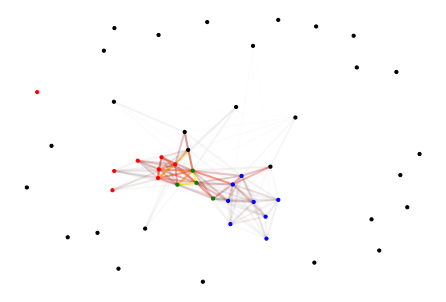

10it [01:25,  8.59s/it]


In [7]:
l_errors_50_p, l_keep_50_p = eval_mcp(train_loader_50_p,planted=True)

In [8]:
print(l_errors_50_p)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [9]:
gen_args['planted'] = False
mcpg_vanilla = MCP_True_Generator('train',gen_args)
mcpg_vanilla.load_dataset()
train_loader_50_np = siamese_loader(mcpg_vanilla, 1, mcpg_vanilla.constant_n_vertices,shuffle=False)

Reading dataset at dataset_sbm/MCP_true_10_50_11_0.7/train.pkl


0it [00:00, ?it/s]

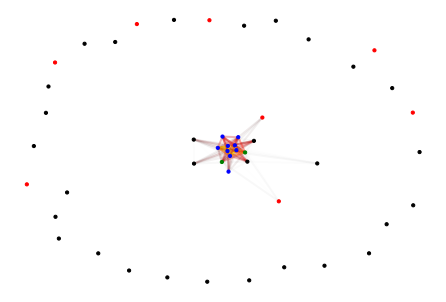

1it [00:12, 12.91s/it]

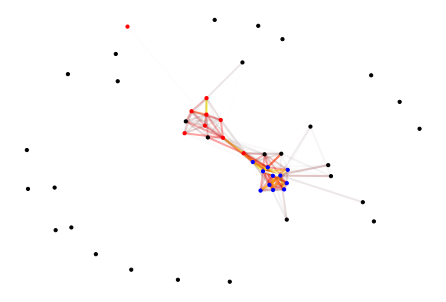

2it [00:21, 10.46s/it]

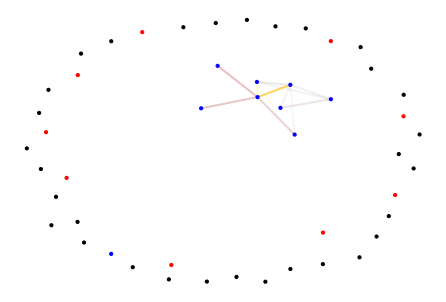

3it [00:32, 10.50s/it]

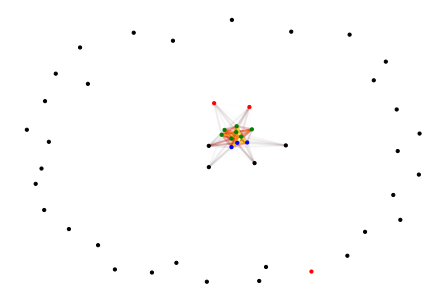

4it [00:41,  9.88s/it]

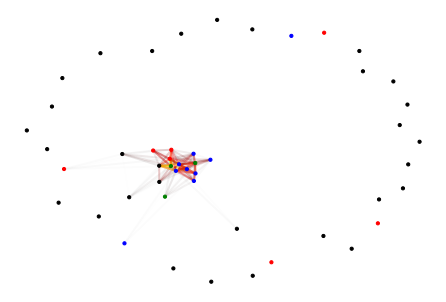

5it [00:51,  9.93s/it]

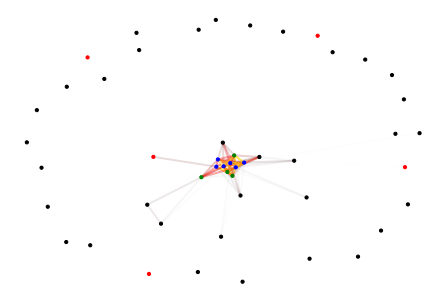

6it [00:58,  9.13s/it]

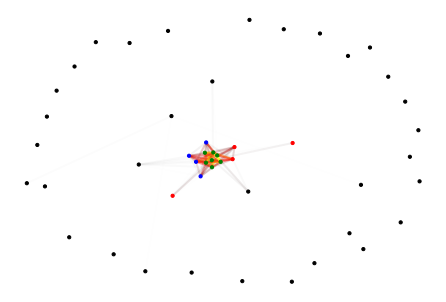

7it [01:08,  9.42s/it]

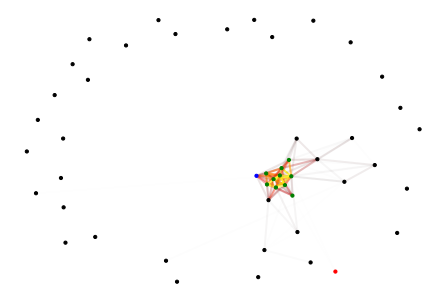

8it [01:16,  8.98s/it]

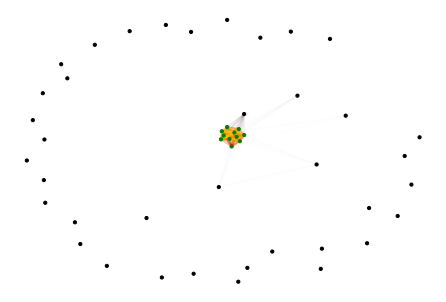

9it [01:25,  8.92s/it]

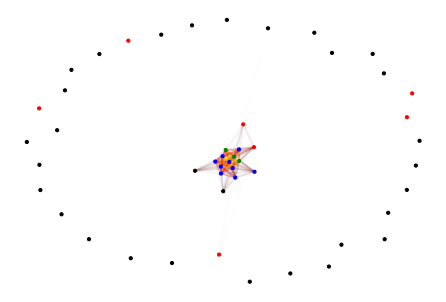

10it [01:34,  9.42s/it]


In [10]:
l_errors_50_np,l_keep_50_np = eval_mcp(train_loader_50_np,planted=False)

In [11]:
print(l_errors_50_np)

[0, -1, 0, 0, -1, 0, 0, 0, 0, -1]


Testing on bigger graphs ?

In [12]:
gen_args['n_vertices'] = 100
mcpg_100 = MCP_True_Generator('train',gen_args)
mcpg_100.load_dataset()
train_loader_100 = siamese_loader(mcpg_100, 1, mcpg_100.constant_n_vertices,shuffle=False)

Reading dataset at dataset_sbm/MCP_true_10_100_11_0.7/train.pkl


0it [00:00, ?it/s]

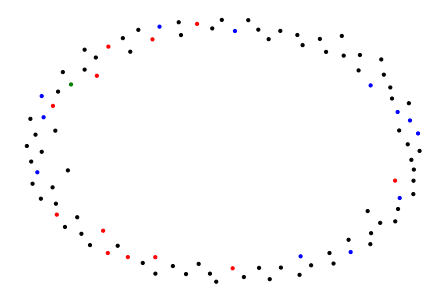

1it [00:22, 22.47s/it]

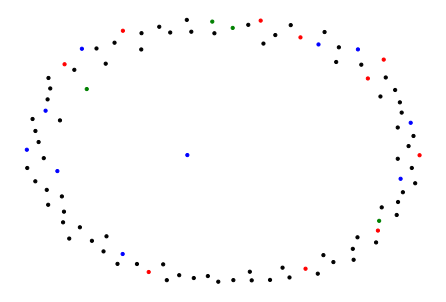

2it [00:43, 21.76s/it]

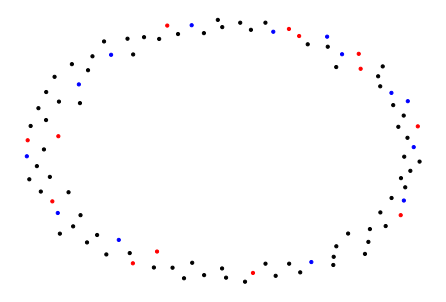

3it [01:05, 21.70s/it]

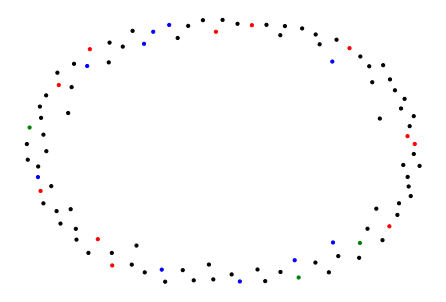

4it [01:22, 19.97s/it]

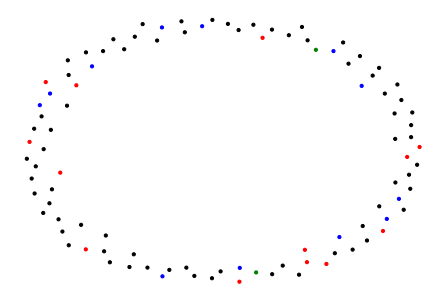

5it [01:38, 18.32s/it]

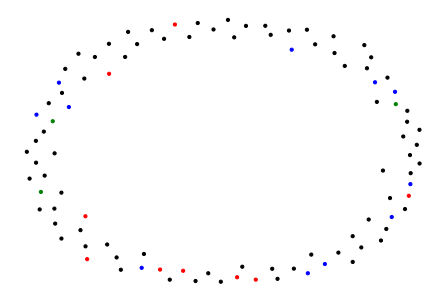

6it [01:52, 17.11s/it]

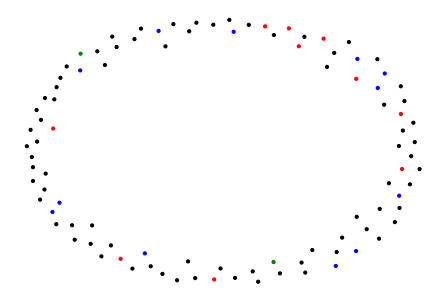

7it [02:07, 16.45s/it]

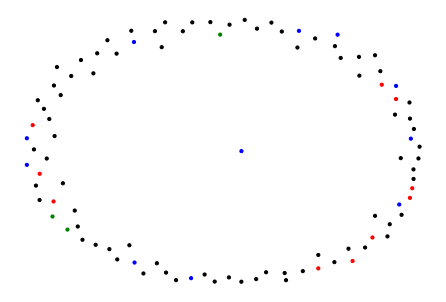

8it [02:22, 15.96s/it]

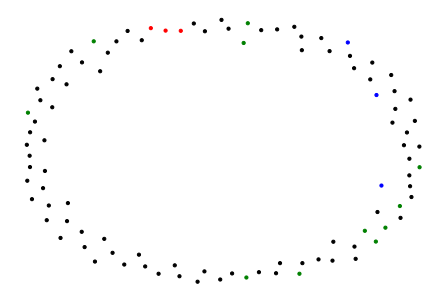

9it [02:39, 16.16s/it]

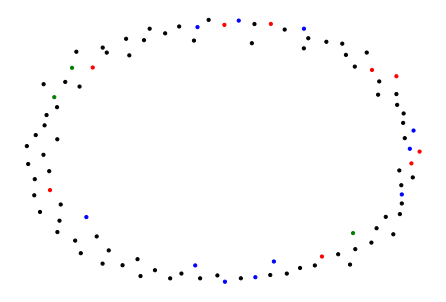

10it [02:57, 17.74s/it]


In [13]:
l_errors_100,l_keep_100 = eval_mcp(train_loader_100,planted=False,name='100-graph-')

In [14]:
print(l_errors_100)

[1, 0, -1, 1, 1, -1, -1, -1, 1, -1]


On smaller graphs

In [15]:
gen_args['n_vertices'] = 30
mcpg_30 = MCP_True_Generator('train',gen_args)
mcpg_30.load_dataset()
train_loader_30 = siamese_loader(mcpg_30, 1, mcpg_30.constant_n_vertices,shuffle=False)

Reading dataset at dataset_sbm/MCP_true_10_30_11_0.7/train.pkl


0it [00:00, ?it/s]

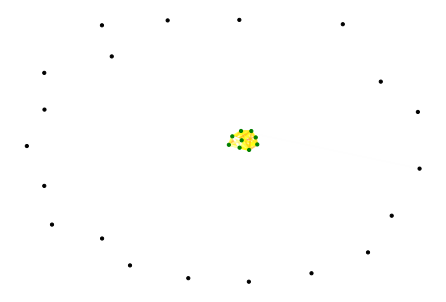

1it [00:06,  6.96s/it]

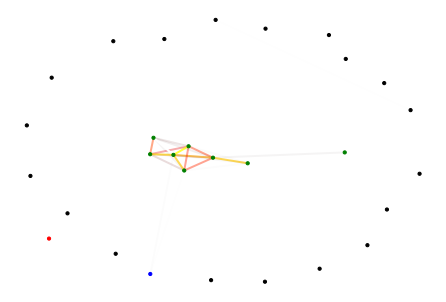

2it [00:11,  5.79s/it]

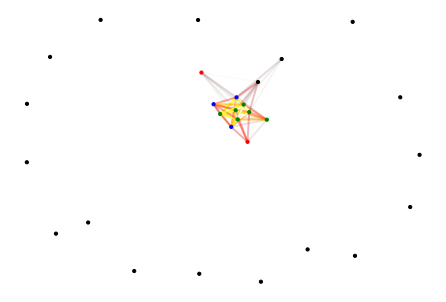

3it [00:16,  5.11s/it]

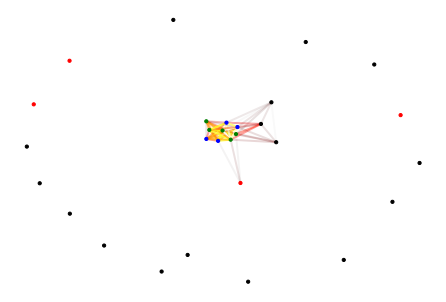

4it [00:20,  4.70s/it]

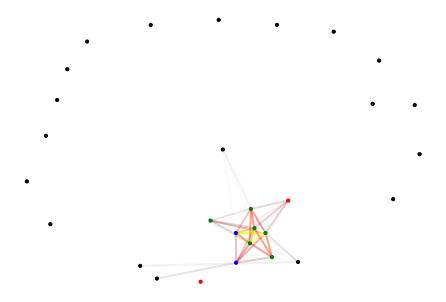

5it [00:24,  4.37s/it]

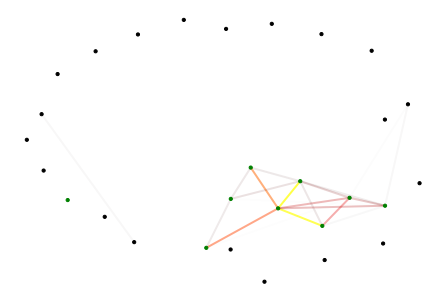

6it [00:28,  4.41s/it]

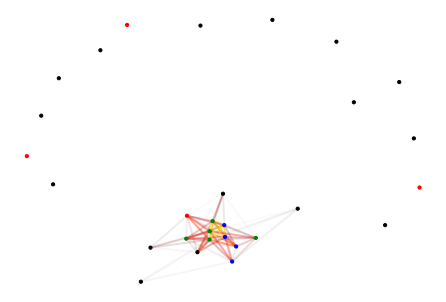

7it [00:32,  4.26s/it]

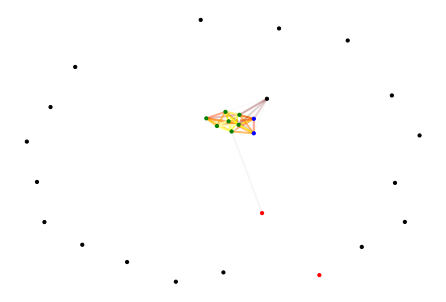

8it [00:37,  4.50s/it]

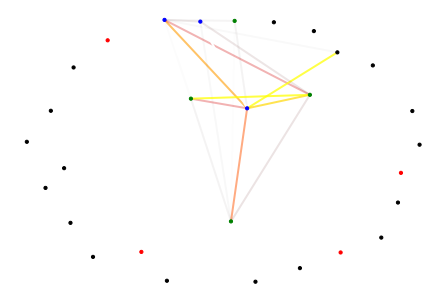

9it [00:42,  4.57s/it]

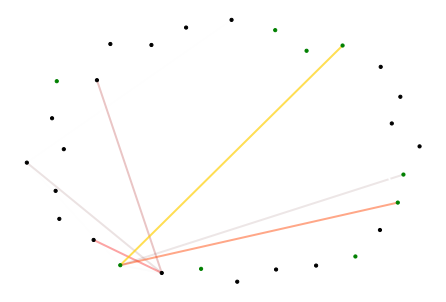

10it [00:46,  4.63s/it]


In [16]:
l_errors_30,l_keep_30 = eval_mcp(train_loader_30,planted='False',name='30-graph')

In [17]:
print(l_errors_30)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
